# **SIGNIFY - BELAJAR BAHASA ISYARAT**

# **Import Library**

In [1]:
# Mengimpor libraries umum yang sering digunakan
import os, shutil
import zipfile
import random
from random import sample
import shutil
from shutil import copyfile
import pathlib
from pathlib import Path
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm as tq

# Mengimpor libraries untuk visualisasi
%matplotlib inline
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.image import imread

# Mengimpor libraries untuk pemrosesan data gambar
import cv2
from PIL import Image
import skimage
from skimage import io
from skimage.transform import resize
from skimage.transform import rotate, AffineTransform, warp
from skimage import img_as_ubyte
from skimage.exposure import adjust_gamma
from skimage.util import random_noise

# Mengimpor libraries untuk pembuatan dan evaluasi model
import keras
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf
from tensorflow.keras import Model, layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.layers import InputLayer, Conv2D, SeparableConv2D, MaxPooling2D, MaxPool2D, Dense, Flatten, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.applications import MobileNetV2, EfficientNetB0
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.utils import to_categorical

from tensorflow.keras.callbacks import ModelCheckpoint, Callback, EarlyStopping, ReduceLROnPlateau

# Mengabaikan peringatan
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# **Download & Extract Dataset**

In [2]:
# Import module yang disediakan google colab untuk kebutuhan upload file
from google.colab import files
# Upload file tanpa menampilkan hasil output upload
_ = files.upload()

Saving kaggle.json to kaggle.json


In [3]:
# Download kaggle dataset and unzip the file
import os
os.makedirs('/root/.kaggle', exist_ok=True)

# Pindahkan dan atur permission file kaggle.json
!cp kaggle.json /root/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

# Download dataset
!kaggle datasets download -d alvinbintang/sibi-dataset

Dataset URL: https://www.kaggle.com/datasets/alvinbintang/sibi-dataset
License(s): copyright-authors


In [4]:
# Unzip dataset
!unzip sibi-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: SIBI/B/1645946451.0243402_B.jpg  
  inflating: SIBI/B/1645946454.6260056_U.jpg  
  inflating: SIBI/B/1645946456.4885087_F.jpg  
  inflating: SIBI/B/1645946460.4972847_B.jpg  
  inflating: SIBI/B/1645946463.7729926_B.jpg  
  inflating: SIBI/B/1645946467.532869_B.jpg  
  inflating: SIBI/B/1645949132.0273714_B.jpg  
  inflating: SIBI/B/1645949136.465165_B.jpg  
  inflating: SIBI/B/1645949142.7455149_B.jpg  
  inflating: SIBI/B/1645949858.470701_Q.jpg  
  inflating: SIBI/B/1645949859.1649747_C.jpg  
  inflating: SIBI/B/1645949859.858002_Q.jpg  
  inflating: SIBI/B/1645949860.5160742_G.jpg  
  inflating: SIBI/B/1645949860.9303768_C.jpg  
  inflating: SIBI/B/1645949863.3891625_C.jpg  
  inflating: SIBI/B/1645949864.6113553_C.jpg  
  inflating: SIBI/B/1645950338.9793453_C.jpg  
  inflating: SIBI/B/1645950339.6984558_C.jpg  
  inflating: SIBI/B/1645950340.2939713_C.jpg  
  inflating: SIBI/B/1645950341.0949953_C.jpg  
  inflating: 

# **Load Dataset**

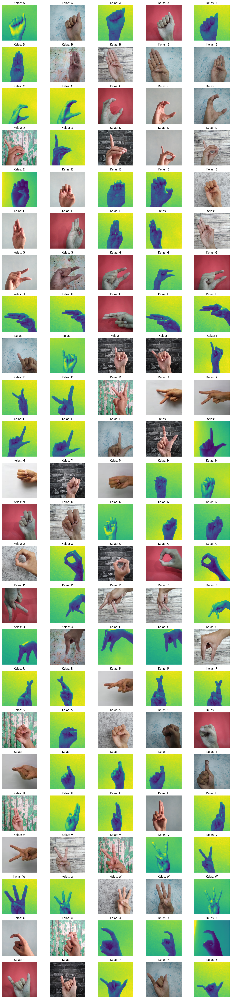

In [5]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Membuat kamus yang menyimpan nama file gambar untuk setiap kelas
sibi_images = {}

# Path dataset Anda
dataset_path = "SIBI"

# Kumpulkan nama file gambar per kelas
for label in sorted(os.listdir(dataset_path)):
    label_dir = os.path.join(dataset_path, label)
    if os.path.isdir(label_dir):
        image_files = [f for f in os.listdir(label_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
        sibi_images[label] = image_files

# Plot 5 gambar secara acak dari setiap kelas
fig, axs = plt.subplots(len(sibi_images), 5, figsize=(15, 60))  # Ukuran disesuaikan agar tidak terlalu padat

for i, label in enumerate(sorted(sibi_images.keys())):
    images = np.random.choice(sibi_images[label], 5, replace=False)

    for j, image_name in enumerate(images):
        img_path = os.path.join(dataset_path, label, image_name)
        img = Image.open(img_path)
        axs[i, j].imshow(img)
        axs[i, j].set_title(f"Kelas: {label}")
        axs[i, j].axis('off')

fig.tight_layout()
plt.show()

# **Exploratory Data Analysis**

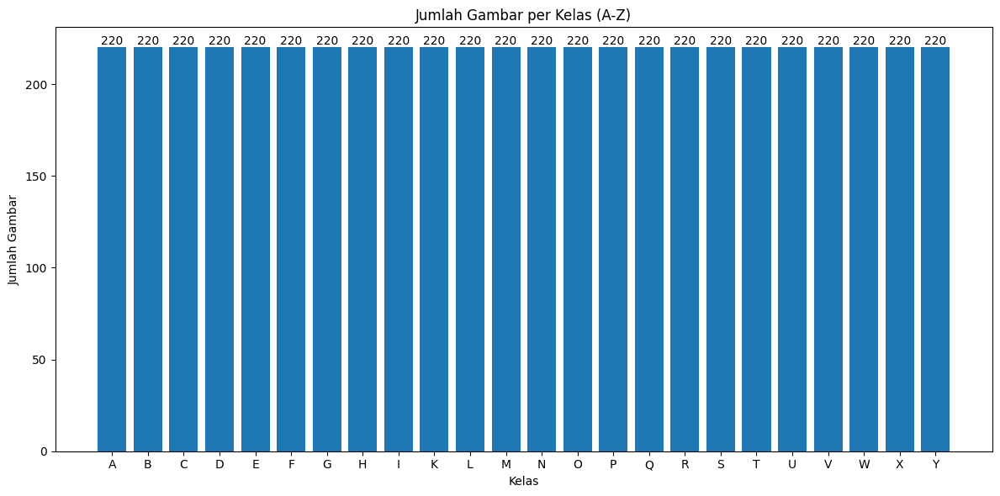

In [6]:
import os
from collections import Counter
import matplotlib.pyplot as plt

# Path ke dataset
dataset_path = "SIBI"

# Hitung jumlah gambar per kelas
label_counts = {}
for label in os.listdir(dataset_path):
    label_path = os.path.join(dataset_path, label)
    if os.path.isdir(label_path):
        count = len([file for file in os.listdir(label_path) if file.lower().endswith(('.jpg', '.png', '.jpeg'))])
        label_counts[label] = count

# Urutkan label berdasarkan abjad
sorted_labels = sorted(label_counts.keys())
sorted_counts = [label_counts[label] for label in sorted_labels]

# Visualisasi
plt.figure(figsize=(12, 6))
bars = plt.bar(sorted_labels, sorted_counts)
plt.title("Jumlah Gambar per Kelas (A-Z)")
plt.xlabel("Kelas")
plt.ylabel("Jumlah Gambar")

# Tambahkan label angka di atas setiap batang
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, height, f'{int(height)}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [7]:
from PIL import Image

corrupt_images = []

for label in os.listdir(dataset_path):
    label_path = os.path.join(dataset_path, label)
    for img_file in os.listdir(label_path):
        img_path = os.path.join(label_path, img_file)
        try:
            img = Image.open(img_path)
            img.verify()  # Verifikasi gambar
        except Exception as e:
            corrupt_images.append(img_path)

print(f"Jumlah gambar korup: {len(corrupt_images)}")
if corrupt_images:
    print("Contoh gambar korup:", corrupt_images[:5])

Jumlah gambar korup: 0


# **Data Splitting**

In [8]:
import os
import shutil
import random
from pathlib import Path
from sklearn.model_selection import train_test_split

# Path asal data setelah augmentasi
source_dir = Path("SIBI")
# Path tujuan split
target_dir = Path("Signify_Cleaned")

# Rasio split
train_ratio = 0.8
val_ratio = 0.1
test_ratio = 0.1

# Pastikan folder target bersih
if target_dir.exists():
    shutil.rmtree(target_dir)
target_dir.mkdir()

# Buat subfolder train, val, test
for split in ['train', 'val', 'test']:
    (target_dir / split).mkdir()

# Iterasi setiap kelas (A-Z)
for class_folder in sorted(source_dir.iterdir()):
    if class_folder.is_dir():
        images = list(class_folder.glob("*.*"))
        class_name = class_folder.name

        # Shuffle
        random.shuffle(images)

        # Split
        train_imgs, temp_imgs = train_test_split(images, train_size=train_ratio, random_state=42)
        val_imgs, test_imgs = train_test_split(temp_imgs, test_size=test_ratio/(test_ratio + val_ratio), random_state=42)

        # Fungsi salin ke folder tujuan
        def copy_images(img_list, split):
            split_class_dir = target_dir / split / class_name
            split_class_dir.mkdir(parents=True, exist_ok=True)
            for img_path in img_list:
                shutil.copy(img_path, split_class_dir / img_path.name)

        copy_images(train_imgs, 'train')
        copy_images(val_imgs, 'val')
        copy_images(test_imgs, 'test')

print("Dataset berhasil di-split dan disimpan di folder 'Signify_Cleaned'")


Dataset berhasil di-split dan disimpan di folder 'Signify_Cleaned'


In [9]:
import os

# Path ke folder hasil split
base_path = "Signify_Cleaned"

# Iterasi folder (train, val, test)
for split in ['train', 'val', 'test']:
    split_path = os.path.join(base_path, split)
    print(f"\n=== Jumlah gambar di folder '{split}' ===")

    total_images = 0

    # Iterasi tiap kelas (A-Z)
    for class_name in sorted(os.listdir(split_path)):
        class_path = os.path.join(split_path, class_name)
        if os.path.isdir(class_path):
            num_images = len([f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.png', '.jpeg'))])
            print(f"{class_name}: {num_images} gambar")
            total_images += num_images

    print(f"Total gambar di '{split}': {total_images}")



=== Jumlah gambar di folder 'train' ===
A: 176 gambar
B: 176 gambar
C: 176 gambar
D: 176 gambar
E: 176 gambar
F: 176 gambar
G: 176 gambar
H: 176 gambar
I: 176 gambar
K: 176 gambar
L: 176 gambar
M: 176 gambar
N: 176 gambar
O: 176 gambar
P: 176 gambar
Q: 176 gambar
R: 176 gambar
S: 176 gambar
T: 176 gambar
U: 176 gambar
V: 176 gambar
W: 176 gambar
X: 176 gambar
Y: 176 gambar
Total gambar di 'train': 4224

=== Jumlah gambar di folder 'val' ===
A: 22 gambar
B: 22 gambar
C: 22 gambar
D: 22 gambar
E: 22 gambar
F: 22 gambar
G: 22 gambar
H: 22 gambar
I: 22 gambar
K: 22 gambar
L: 22 gambar
M: 22 gambar
N: 22 gambar
O: 22 gambar
P: 22 gambar
Q: 22 gambar
R: 22 gambar
S: 22 gambar
T: 22 gambar
U: 22 gambar
V: 22 gambar
W: 22 gambar
X: 22 gambar
Y: 22 gambar
Total gambar di 'val': 528

=== Jumlah gambar di folder 'test' ===
A: 22 gambar
B: 22 gambar
C: 22 gambar
D: 22 gambar
E: 22 gambar
F: 22 gambar
G: 22 gambar
H: 22 gambar
I: 22 gambar
K: 22 gambar
L: 22 gambar
M: 22 gambar
N: 22 gambar
O: 22 

# **Image Data Generator & Augmentation**

In [10]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Augmentasi dinamis untuk training
from tensorflow.keras.applications.efficientnet import preprocess_input

train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    brightness_range=[0.8, 1.2],
    horizontal_flip=True,
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

# Path ke folder hasil split
train_dir = 'Signify_Cleaned/train'
val_dir = 'Signify_Cleaned/val'
test_dir = 'Signify_Cleaned/test'

# Generator untuk masing-masing subset
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)


Found 4224 images belonging to 24 classes.
Found 528 images belonging to 24 classes.
Found 528 images belonging to 24 classes.


# **Modeling**

In [11]:
from tensorflow.keras import models, layers
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.metrics import TopKCategoricalAccuracy

# Load EfficientNetB0 dengan pretrained weights
base_model_efficientnet = EfficientNetB0(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base_model_efficientnet.trainable = False  # Freeze the base model

# Bangun model
model_efficientnet = models.Sequential([
    base_model_efficientnet,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(24, activation='softmax')  # 2 kelas huruf A-I K-Y
])

# Ringkasan model
model_efficientnet.summary()


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 24)             │         6,168 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,384,699 (16.73 MB)

 Trainable params: 334,616 (1.28 MB)

 Non-trainable params: 4,050,083 (15.45 MB)

In [12]:
# Compile model
model_efficientnet.compile(
    optimizer=Adam(),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train model
history_efficientnet = model_efficientnet.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator,
    callbacks=[
        EarlyStopping(patience=10, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, verbose=1)
    ]
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 196s 1s/step - accuracy: 0.3058 - loss: 2.7570 - val_accuracy: 0.7860 - val_loss: 0.9699 - learning_rate: 0.0010
Epoch 2/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 162s 1s/step - accuracy: 0.7106 - loss: 0.9042 - val_accuracy: 0.9053 - val_loss: 0.4370 - learning_rate: 0.0010
Epoch 3/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 161s 1s/step - accuracy: 0.7974 - loss: 0.6383 - val_accuracy: 0.8939 - val_loss: 0.3515 - learning_rate: 0.0010
Epoch 4/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 152s 1s/step - accuracy: 0.8434 - loss: 0.5021 - val_accuracy: 0.9451 - val_loss: 0.2214 - learning_rate: 0.0010
Epoch 5/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 150s 1s/step - accuracy: 0.8670 - loss: 0.4181 - val_accuracy: 0.9451 - val_loss: 0.1906 - learning_rate: 0.0010
Epoch 6/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 153s 1s/step - accuracy: 0.8781 - loss: 0.3957 - val_accuracy: 0.9470 - val_loss: 0.2067 - learning_rate: 0.0010
Epoch 7/50
132/132 ━━━━━━━━━━━━━━━━━━━━ 152s 1s/step - accuracy: 0.8865 - loss: 0.

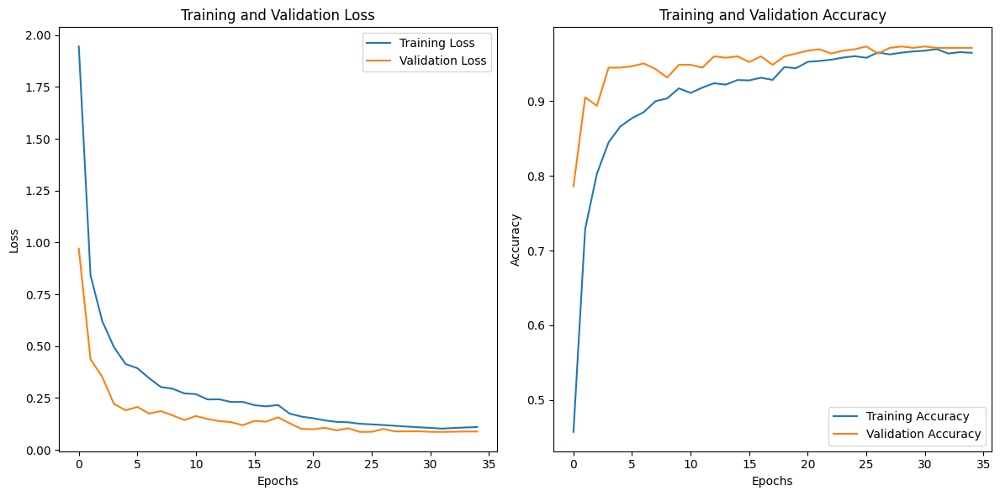

In [13]:
# Plot training and validation loss
plt.figure(figsize=(12, 6))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(history_efficientnet.history['loss'], label='Training Loss')
plt.plot(history_efficientnet.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(history_efficientnet.history['accuracy'], label='Training Accuracy')
plt.plot(history_efficientnet.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [17]:
test_loss, test_acc = model_efficientnet.evaluate(test_generator)
print(f"Test accuracy: {test_acc:.2f}")

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 11s 673ms/step - accuracy: 0.9675 - loss: 0.0776
Test accuracy: 0.96


In [18]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

y_true = test_generator.classes
y_pred = np.argmax(model_efficientnet.predict(test_generator), axis=1)

print(classification_report(y_true, y_pred, target_names=test_generator.class_indices.keys()))
cm = confusion_matrix(y_true, y_pred)

17/17 ━━━━━━━━━━━━━━━━━━━━ 23s 995ms/step
              precision    recall  f1-score   support

           A       1.00      1.00      1.00        22
           B       0.95      0.86      0.90        22
           C       1.00      1.00      1.00        22
           D       1.00      1.00      1.00        22
           E       0.96      1.00      0.98        22
           F       0.81      0.95      0.88        22
           G       1.00      1.00      1.00        22
           H       1.00      1.00      1.00        22
           I       0.96      1.00      0.98        22
           K       0.91      0.91      0.91        22
           L       1.00      1.00      1.00        22
           M       0.95      0.91      0.93        22
           N       0.91      0.95      0.93        22
           O       1.00      1.00      1.00        22
           P       0.95      0.91      0.93        22
           Q       0.96      1.00      0.98        22
           R       1.00      0.91      

In [14]:
model_efficientnet.save('efficientnet_signify.h5')
from google.colab import files
files.download('efficientnet_signify.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [15]:
!pip install tensorflowjs

import tensorflowjs as tfjs

tfjs.converters.save_keras_model(model_efficientnet, 'signify_tfjs_model_efficientnet')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 5.0 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-cloud-bigquery 3.31.0 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.


failed to lookup keras version from the file,
    this is likely a weight only file
weight normalization/count with shape () and dtype int64 was auto converted to the type int32


In [16]:
import shutil

# Membuat file ZIP dari folder model
shutil.make_archive('signify_tfjs_model_efficientnet', 'zip', 'signify_tfjs_model_efficientnet')

from google.colab import files

# Download file ZIP ke komputer lokal
files.download('signify_tfjs_model_efficientnet.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [24]:
!pip freeze > signify_ml_requirements.txt

In [25]:
from google.colab import files
files.download('signify_ml_requirements.txt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>